# **[Supervised Workflow]** Remote Sensing Analysis of Mangrove Forest Health and Extent in the Grand-Pierre Bay, Artibonite, Haiti <hr>
Written by Alexandre Erich Sebastien Georges, *PhD Student at UC Berkeley in EFMH-Civil and Environmental Engineering*, January 2023

In [1]:
import itertools, glob, re, datetime

from ipywidgets import FloatProgress

from joblib import dump, load

import cv2 as cv
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import rioxarray as rxr
import earthpy.plot as ep
import matplotlib.pyplot as plt

from scipy import ndimage

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score


import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib import colors as colors_mat

import seaborn as sns

from tqdm.notebook import tqdm

from params import *

# Data Acquisition

## AOI Selection

In [2]:
aoi_list = ['seaward', 'landward'] #['shapes_Grand-Pierre', 'shapes_de la Tortue', 'shapes_Gonaives']
#aoi_list = ['north (horn)', 'northeast', 'west', 'center', 'east', 'southwest', 'south']
#aoi_list = ['coast_NW', 'coast_N', 'horn', 'coastline_gonave', 'marsh_E', 'marsh_W']
#aoi_list = ['west','east','barrier', 'coast_marsh_S']

## PlanetLabs GeoTIFFs Acquisition

In [3]:
# Pull paths of .shp files of AOIs
def aoi_path(name):
    return '../datasets/Shapefiles/'+name+'.shp'

def paths_to_datetimeindex(list):
    pattern = PATTERN_REGEX
    new_list = []
    for item in list:
        time = re.search(pattern, item).group(1)
        time = datetime.strptime(time, '%m-%d-%Y').date()
        new_list.append(time)
    new_list = sorted(new_list)    
    return new_list

In [4]:
data_dir = '../' + DOWNLOAD_DIR_HT + '*.tif' # Make sure to have the right path for data location

sites = []
resSites = []
#unmaskedSites = [] # Eliminated unmaskedSites as new workflow does not require copying an unmasked version of TIFF files, all the data is coming from the sites Dataset file.

times = [i.strftime('%m-%d-%Y') for i in paths_to_datetimeindex(glob.glob(data_dir))]
time_var = xr.Variable('Observation Date', times)

for area in aoi_list:
    aoi = gpd.read_file(aoi_path(area))
    geotiffs_da = xr.concat(
        [rxr.open_rasterio(entry).rio.clip(aoi.geometry, from_disk=True).squeeze() 
        for entry in glob.glob(data_dir)], dim=time_var)
    area_ds = geotiffs_da.to_dataset(dim='Observation Date')
    sites.append(area_ds)
    resSites.append(area_ds.rio.resolution()[0])
    #unmaskedSites.append(area_ds.copy())

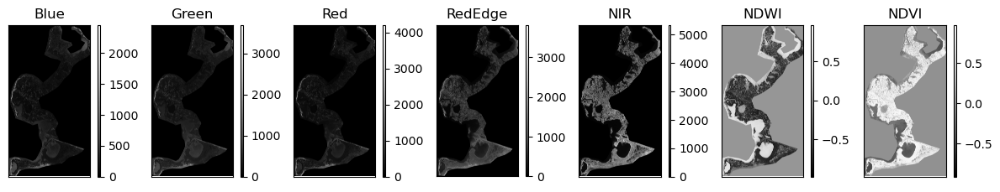

In [5]:
band_titles = ['Blue', 'Green', 'Red', 'RedEdge', 'NIR', 'NDWI', 'NDVI']
ep.plot_bands(sites[0][times[-1]], cols=7, title=band_titles);

In [6]:
area_ds  

<xarray.Dataset>
Dimensions:      (band: 7, y: 2291, x: 1661)
Coordinates:
  * x            (x) float64 7.373e+05 7.373e+05 ... 7.456e+05 7.456e+05
  * y            (y) float64 2.147e+06 2.147e+06 ... 2.136e+06 2.136e+06
  * band         (band) int32 1 2 3 4 5 6 7
    spatial_ref  int32 0
Data variables:
    12-05-2010   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    12-28-2011   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    04-03-2012   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    01-05-2013   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    12-22-2014   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    12-14-2015   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    09-23-2016   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    12-27-2017   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    12-30-2018   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    12-27-2019   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    01-20-2020   (band, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    _FillValue:     0.0

# Band Math and Indexes

### Water Masking 
In order to get accurate trends for vegetation alone, we are masking out surface water using our calculated NDWIs.

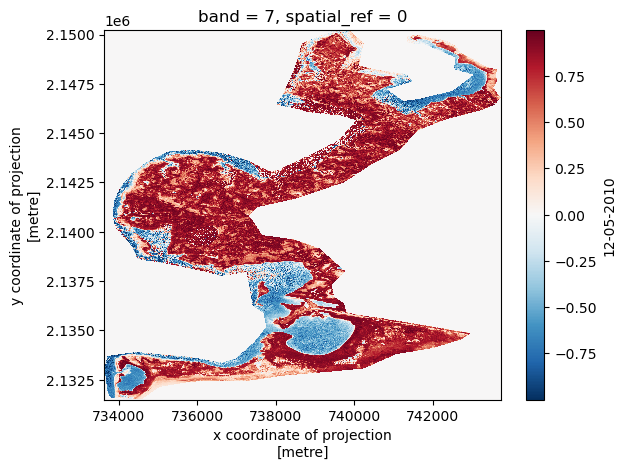

In [7]:
# Reminder that we calculated ndwi_masks earlier
sites[0][times[0]][-1].plot()

In [8]:
# Masking water out of observations
mask_count = 0
for i, site in enumerate(sites):
    for time in times:
        # Masking out water in NDVI band
        new_ndvi = np.ma.masked_where(site[time][-2] > -0.2, site[time][-1])
        # Masking out water in MSAVI2 band
        #new_msavi = np.ma.masked_where(ndwiMasks[i][time] > -0.2, site[time][-1])
        # Dropping out NaNs
        site[time][-1] = np.nan_to_num(new_ndvi, nan=0)
        #site[time][-2] = np.nan_to_num(new_ndvi, nan=0)
        mask_count+=1

### Modified Soil Adjusted Vegetation Index (MSAVI2)

In [9]:
"""# msavi2 = (2 * nir + 1 - sqrt( (2 * nir + 1)^2 - 8 * (nir - red) )) / 2 

for i,site in enumerate(sites):
    msavi_times = []
    for time in times:
        msavi = 0.5*(2*site[time][3] + 1 - np.sqrt(np.square(2*site[time][3]+1) - 8*(site[time][3] - site[time][2])))
        msavi_times.append(xr.DataArray(msavi, coords={'band' : 'MSAVI2'}))
        #site = xr.concat([site, ndwi_arr.to_dataset()], dim="band")
    msavi_arr = (xr.concat(msavi_times, dim=time_var)).to_dataset(dim='Observation Date')
    sites[i] = xr.concat([site, msavi_arr], dim="band")"""

'# msavi2 = (2 * nir + 1 - sqrt( (2 * nir + 1)^2 - 8 * (nir - red) )) / 2 \n\nfor i,site in enumerate(sites):\n    msavi_times = []\n    for time in times:\n        msavi = 0.5*(2*site[time][3] + 1 - np.sqrt(np.square(2*site[time][3]+1) - 8*(site[time][3] - site[time][2])))\n        msavi_times.append(xr.DataArray(msavi, coords={\'band\' : \'MSAVI2\'}))\n        #site = xr.concat([site, ndwi_arr.to_dataset()], dim="band")\n    msavi_arr = (xr.concat(msavi_times, dim=time_var)).to_dataset(dim=\'Observation Date\')\n    sites[i] = xr.concat([site, msavi_arr], dim="band")'

# Supervised Land Cover Classification

Visualization Legend

In [10]:
custom_cmap = colors_mat.ListedColormap(colors=['blue', 'forestgreen', 'tan', 'mediumseagreen', 'gray', 'lightsteelblue'])
boundaries = [0, 1, 2, 3, 4, 5]
custom_norm = colors_mat.BoundaryNorm(boundaries, custom_cmap.N, clip=True)

patches = [mpatches.Patch(color='forestgreen', label='Mangrove'),
            mpatches.Patch(color='blue', label='Water'),
            mpatches.Patch(color='tan', label='Mud Flat'),
            mpatches.Patch(color='mediumseagreen', label='Crops/Other Vegetation'),
            mpatches.Patch(color='gray', label='Urban'),
            mpatches.Patch(color='lightsteelblue', label='Other'),]

## Loading in dumped Classifier

In [11]:
hgb = load('../'+CLASSIFIER_PATH)

## Reshaping Data to be classified

In [12]:
reshapedSites = []
for site in sites:
    shapes = tuple(site.dims[d] for d in ['band', 'y', 'x'])
    resh_times = []
    for time in times:
        acq = [band.values.reshape(((band.shape)[0])*((band.shape)[1]), 1) for band in site[time]]
        resh = np.array(acq).reshape(shapes[0], shapes[1]*shapes[2]).transpose()
        resh_times.append(resh)
    reshapedSites.append(resh_times)

## Image Classification

In [14]:
classifiedSites = []
for resh in tqdm(reshapedSites):
    time_pred = []
    for obs in tqdm(resh):
        # Filling NaNs with -999
        #obs = np.where(np.isnan(obs), np.ma.array(obs,
         #      mask = -999))
        time_pred.append(hgb.predict(obs))
    classifiedSites.append(time_pred)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

# Post-Processing for Analysis

## CannyEdge and Gaussian Blur for Visualization

In [15]:
classifiedSites_r = []
classifiedSites_blur = []
for i, site in enumerate(classifiedSites):
    sites_r = []
    sites_blur = []
    for j, time in enumerate(times):
        obs_r = site[j].reshape(sites[i][time][0].shape).astype("uint8")
        obs_blur = cv.GaussianBlur(obs_r, (3,3), 0)
        sites_r.append(obs_r)
        sites_blur.append(obs_blur)
    classifiedSites_r.append(sites_r)
    classifiedSites_blur.append(sites_blur)

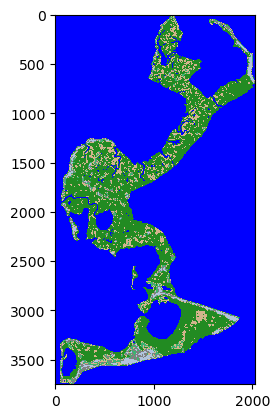

In [16]:
plt.imshow(classifiedSites_blur[0][0], cmap=custom_cmap)

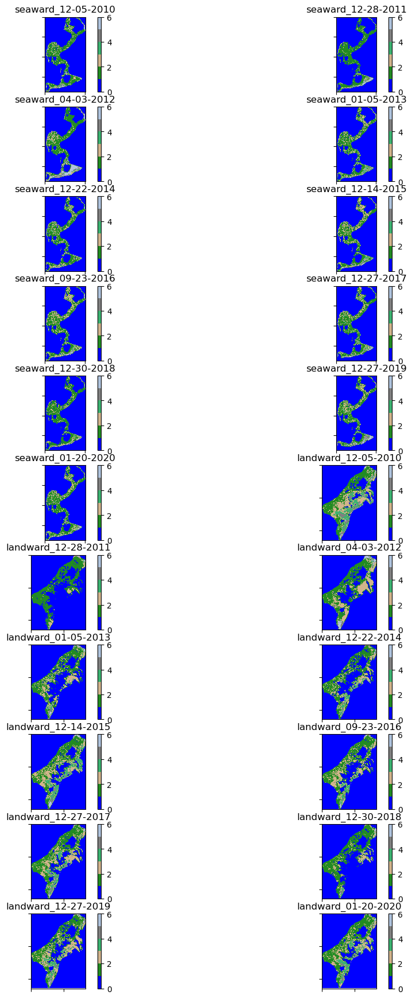

In [17]:
fig, axs = plt.subplots(11,2, figsize=(12,22))
axs = list(itertools.chain.from_iterable(axs))
count = 0
for j,blur in enumerate(classifiedSites_blur):
    for i,ob in enumerate(blur):
        nd = axs[count].imshow(ob, cmap=custom_cmap)
        axs[count].set_xticklabels([])
        axs[count].set_yticklabels([])
        axs[count].set_title(aoi_list[j]+'_'+times[i])
        plt.colorbar(nd, ax = axs[count])
        count+=1
plt.show()


## Masking and Keeping Mangrove Cover

In [18]:
mangroveSites = []
mangroveSites_blur = []
for i, site in enumerate(classifiedSites_blur):
    # Masking everything else and keeping mangrove cover
    masks_blur = [np.ma.masked_where(bl != 1, bl) for bl in site]
    masks = [np.ma.masked_where(pred != 1, pred) for pred in classifiedSites_r]
    mangroveSites_blur.append(masks_blur)
    mangroveSites.append(masks_blur)


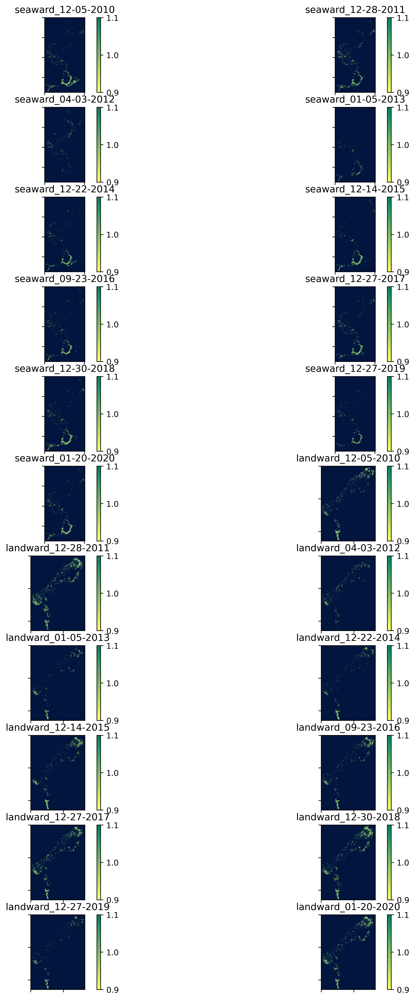

In [19]:
fig, axs = plt.subplots(11,2, figsize=(12,22), dpi=400)
axs = list(itertools.chain.from_iterable(axs))
count = 0
for j,blur in enumerate(mangroveSites):
    for i,ob in enumerate(blur):
        axs[count].set_facecolor('xkcd:navy')
        nd = axs[count].imshow(ob, cmap='summer_r')
        axs[count].set_xticklabels([])
        axs[count].set_yticklabels([])
        axs[count].set_title(aoi_list[j]+'_'+times[i])
        plt.colorbar(nd, ax = axs[count])
        count+=1
plt.show()

# Analysis

### Center of Mass

In [20]:
comSites = []
for site in mangroveSites:
    coms = [ndimage.center_of_mass(ob) for ob in site]
    comSites.append(coms)

## Gross Cover and 2MOA Calculations

In [21]:
def moa_calc(inputSites, dir): # Inputs are region to calculate MOA on and the direction to take MOA on, dir = 'x' or 'y'
    secMOAs = []
    for j in range(len(times)):
        moa_yr = []
        for i, input in enumerate(inputSites):
            # X direction MOA
            if dir == 0:
                pixs = [row.count() for row in input[j]]
                dists = [3*((input[j].shape[0])/2 - 1 - k) for k in range(len(input[j]))]
            # Y direction MOA 
            elif dir == 1:
                pixs = [col.count() for col in input[j].T]
                dists = [3*(((input[j].T).shape[0])/2 - 1 - k) for k in range(len(input[j].T))]
            
            moa = 0
            for l,pix in enumerate(pixs):
                moa += (3**2)*pix * dists[l]**2 
            moa_yr.append(moa)
        secMOAs.append(moa_yr)

    changeMOA = [secMOAs[-1][i] - secMOAs[0][i] for i in range(len(secMOAs[0]))]
    percMOA = [(change*100)/(secMOAs[0][i]) for i, change in enumerate(changeMOA)]

    return secMOAs, changeMOA, percMOA

In [46]:
def get_metrics(inputSites):
    pixelSites = []
    areaSites = []
    changeSites = []
    percChangeSites = []
    secMOAs_x = []
    
    # Counting Pixels for Area calculations
    for i, mask in enumerate(inputSites):
        pixels = np.array([np.size(m.mask) - np.count_nonzero(m.mask) for m in mask])
        pixelSites.append(pixels)
    
    # Calcualte Gross Cover Change   
    for i, pixels in enumerate(pixelSites):
        surfaces = [(3**2)*pixel_obs for pixel_obs in pixels]
        areaSites.append(surfaces)
        change = (surfaces[-1] - surfaces[0])/(1e6)
        percent = (change*100)/(surfaces[0]/1e6)
        changeSites.append(change)
        percChangeSites.append(percent)

    # Calculate MOA in x and y
    secMOAs_x, changeMOA_x, percMOA_x = moa_calc(inputSites, 0)
    secMOAs_y, changeMOA_y, percMOA_y = moa_calc(inputSites, 1)

    # Calculate Polar MOA
    secMOA_pol = []
    for i, year in enumerate(secMOAs_x):
            moa_yr = [moa_x + secMOAs_y[i][j] for j, moa_x in enumerate(year)]
            secMOA_pol.append(moa_yr)

    changeMOA_pol = [secMOA_pol[-1][i] - secMOA_pol[0][i] for i in range(len(secMOA_pol[0]))]
    percMOA_pol = [(change*100)/(secMOA_pol[0][i]) for i, change in enumerate(changeMOA_pol)] 
    
    return areaSites, changeSites, percChangeSites, secMOAs_x, changeMOA_x, percMOA_x, secMOAs_y, changeMOA_y, percMOA_y, secMOA_pol, changeMOA_pol, percMOA_pol

In [53]:
# areaSites, changeSites, percChangeSites, secMOAs_x, changeMOA_x, percMOA_x, secMOAs_y, changeMOA_y, percMOA_y, secMOA_pol, changeMOA_pol, percMOA_pol 
metrics_healthy = get_metrics(mangroveSites)

df_mangrove_analysis = pd.DataFrame({'AOI': aoi_list, 'Gross Cover Change (km^2)': metrics_healthy[1],
                'Gross Percent Change (%)': metrics_healthy[2],
                'Polar 2MOA Change (2022-2012)': metrics_healthy[-2],
                'Polar 2MOA Percent Change (%)': metrics_healthy[-1]})
df_mangrove_analysis

,AOI,Gross Cover Change (km^2),Gross Percent Change (%),Polar 2MOA Change (2022-2012),Polar 2MOA Percent Change (%)
0,seaward,-0.421200,-4.288738,-6.318676e+12,-6.101967
1,landward,0.610398,14.002482,1.440141e+12,6.748109


Yearly Change

In [176]:
seaward_change = metrics_healthy[0][0]
landward_change = metrics_healthy[0][1]
moaseaward_change = np.array(metrics_healthy[-3]).T[0]
moalandward_change = np.array(metrics_healthy[-3]).T[1]

In [135]:
sea_change = []
land_change = []
perc_sea_change = []
perc_land_change = []
for i in range(len(seaward_change) - 1):
    seachange = seaward_change[i+1] - seaward_change[i]
    seachange_percent = (seachange/(seaward_change[i]))*100
    landchange = landward_change[i+1] - landward_change[i]
    landchange_percent = (landchange/(landward_change[i]))*100
    
    sea_change.append(seachange)
    land_change.append(landchange)
    perc_sea_change.append(seachange_percent)
    perc_land_change.append(landchange_percent)

In [178]:
moa_sea_change = []
moa_land_change = []
moa_perc_sea_change = []
moa_perc_land_change = []
for i in range(len(moaseaward_change) - 1):
    moaseachange = moaseaward_change[i+1] - moaseaward_change[i]
    moaseachange_percent = (moaseachange/(moaseaward_change[i]))*100
    moalandchange = moalandward_change[i+1] - moalandward_change[i]
    moalandchange_percent = (moalandchange/(moalandward_change[i]))*100
    
    moa_sea_change.append(moaseachange)
    moa_land_change.append(moalandchange)
    moa_perc_sea_change.append(moaseachange_percent)
    moa_perc_land_change.append(moalandchange_percent)

In [179]:
area_prog = [perc_sea_change, perc_land_change]
moa_prog = [moa_perc_sea_change, moa_perc_land_change]

In [221]:
# areaSites, changeSites, percChangeSites, secMOAs_x, changeMOA_x, percMOA_x, secMOAs_y, changeMOA_y, percMOA_y, secMOA_pol, changeMOA_pol, percMOA_pol 
def metrics_prog(metric, area_prog, moa_prog, title):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.set_xlabel('Gross Cover Percent Change (%)')
    ax.set_ylabel('Polar Moment of Area Percent Change (%)')
    
    # Start positions (X is set of gross covers at Y1, Y is set of 2MOA_pol at Y1)
    areaSites = np.array(metric[0])
    percChangeSites = np.array(metric[2])
    percMOA_pol = np.array(metric[-1])
    
    U = percChangeSites
    V = percMOA_pol

    X = [0,0] #(areaSites.T[0])/1e6
    Y = [0,0]#np.array((metric[-3])[0])/1e12
    # Magnitude is distance change (U is for gross cover change, V is for 2MOA change)
    # Color code of arrows (blue for increase in both, red for decrease in both, gray for other)
    arr_colors = []
    for i, change in enumerate(U):
        if change > 0 and V[i] > 0:
            arr_colors.append('blue')
        elif change < 0 and V [i] < 0:
            arr_colors.append('red')
        else:
            arr_colors.append('green') 
    
    ax.grid()
    ax.scatter(x=X, y=Y, c='k')
    ax.scatter(x=U, y=V, c='k', alpha=0.5)

    U_prog = np.concatenate((np.array([0]), np.array(area_prog[0][:-1])))
    V_prog = np.concatenate((np.array([0]), np.array(moa_prog[0][:-1])))
    ax.scatter(x=area_prog[0], y=moa_prog[0], c='k', alpha=0.25)
    ax.quiver(U_prog, V_prog,area_prog[0], moa_prog[0], color='green', angles='xy', scale_units='xy', scale=1, alpha=0.25)
    
    ax.quiver(X,Y,U,V, color=arr_colors, angles='xy', scale_units='xy', scale=1, alpha=1)
    for i, label in enumerate(aoi_list):
        plt.annotate(label, (U[i] + 0.005, V[i] - 0.25,))

    patches = [mpatches.Patch(color='blue', label='Net Increase in Gross Cover and Distribution'),
                mpatches.Patch(color='green', label='Mixed Change'),
                mpatches.Patch(color='red', label='Net Decrease in Gross Cover and Distribution')]
    ax.legend(handles=patches, loc='lower right', borderaxespad=0.)
    ax.set_title(title)
    ax.patch.set_facecolor('xkcd:white')
    ax.set_axisbelow(True)

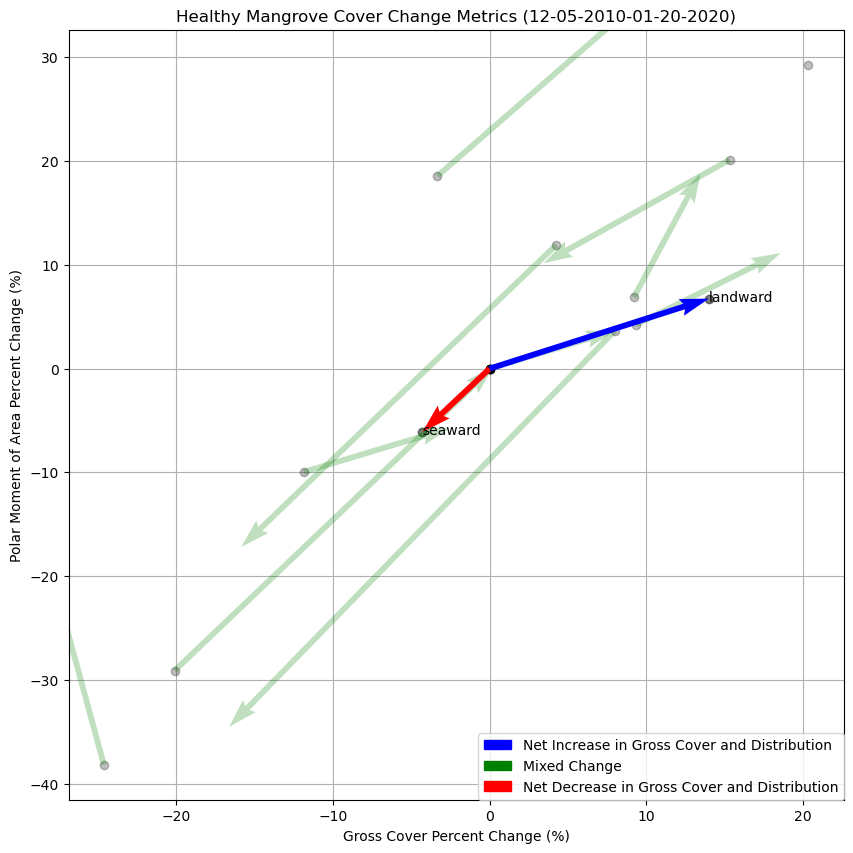

In [222]:
metrics_prog(metrics_healthy, area_prog, moa_prog, 'Healthy Mangrove Cover Change Metrics ('+times[0]+'-'+times[-1]+')')

## Mangrove Extent Metrics

In [119]:
# areaSites, changeSites, percChangeSites, secMOAs_x, changeMOA_x, percMOA_x, secMOAs_y, changeMOA_y, percMOA_y, secMOA_pol, changeMOA_pol, percMOA_pol 
def metrics_visualization(metric, title):
    fig, ax = plt.subplots(figsize=(10,10))
    ax.set_xlabel('Gross Cover Percent Change (%)')
    ax.set_ylabel('Polar Moment of Area Percent Change (%)')
    
    # Start positions (X is set of gross covers at Y1, Y is set of 2MOA_pol at Y1)
    areaSites = np.array(metric[0])
    percChangeSites = np.array(metric[2])
    percMOA_pol = np.array(metric[-1])
    
    U = percChangeSites
    V = percMOA_pol

    X = [0,0] #(areaSites.T[0])/1e6
    Y = [0,0]#np.array((metric[-3])[0])/1e12
    # Magnitude is distance change (U is for gross cover change, V is for 2MOA change)
    # Color code of arrows (blue for increase in both, red for decrease in both, gray for other)
    arr_colors = []
    for i, change in enumerate(U):
        if change > 0 and V[i] > 0:
            arr_colors.append('blue')
        elif change < 0 and V [i] < 0:
            arr_colors.append('red')
        else:
            arr_colors.append('green') 
    
    ax.grid()
    ax.scatter(x=X, y=Y, c='k')
    ax.scatter(x=U, y=V, c='k', alpha=0.25)
    ax.quiver(X,Y,U,V, color=arr_colors, angles='xy', scale_units='xy', scale=1, alpha=1)
    for i, label in enumerate(aoi_list):
        plt.annotate(label, (U[i] + 0.005, V[i] - 0.25,))

    patches = [mpatches.Patch(color='blue', label='Net Increase in Gross Cover and Distribution'),
                mpatches.Patch(color='green', label='Mixed Change'),
                mpatches.Patch(color='red', label='Net Decrease in Gross Cover and Distribution')]
    ax.legend(handles=patches, loc='lower right', borderaxespad=0.)
    ax.set_title(title)
    ax.patch.set_facecolor('xkcd:white')
    ax.set_axisbelow(True)

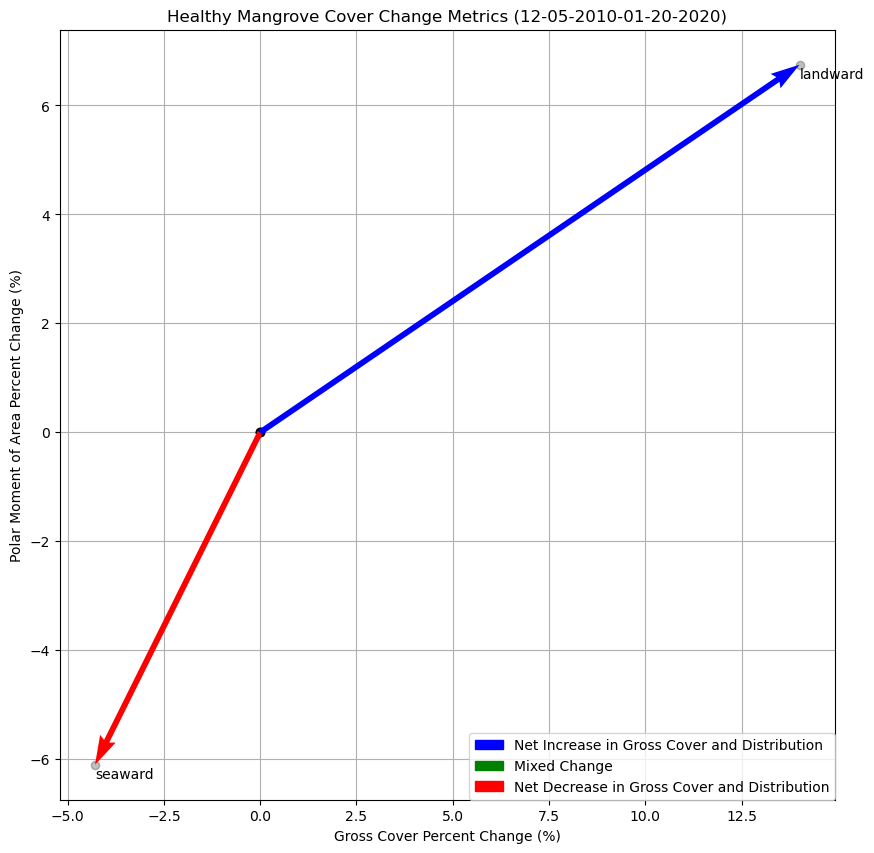

In [120]:
metrics_visualization(metrics_healthy, 'Healthy Mangrove Cover Change Metrics ('+times[0]+'-'+times[-1]+')')

## Mangrove Cover Change Visualizations

In [ ]:
np.unique(mangroveSites[0][0])

masked_array(data=[1, --],
             mask=[False,  True],
       fill_value=999999,
            dtype=uint8)

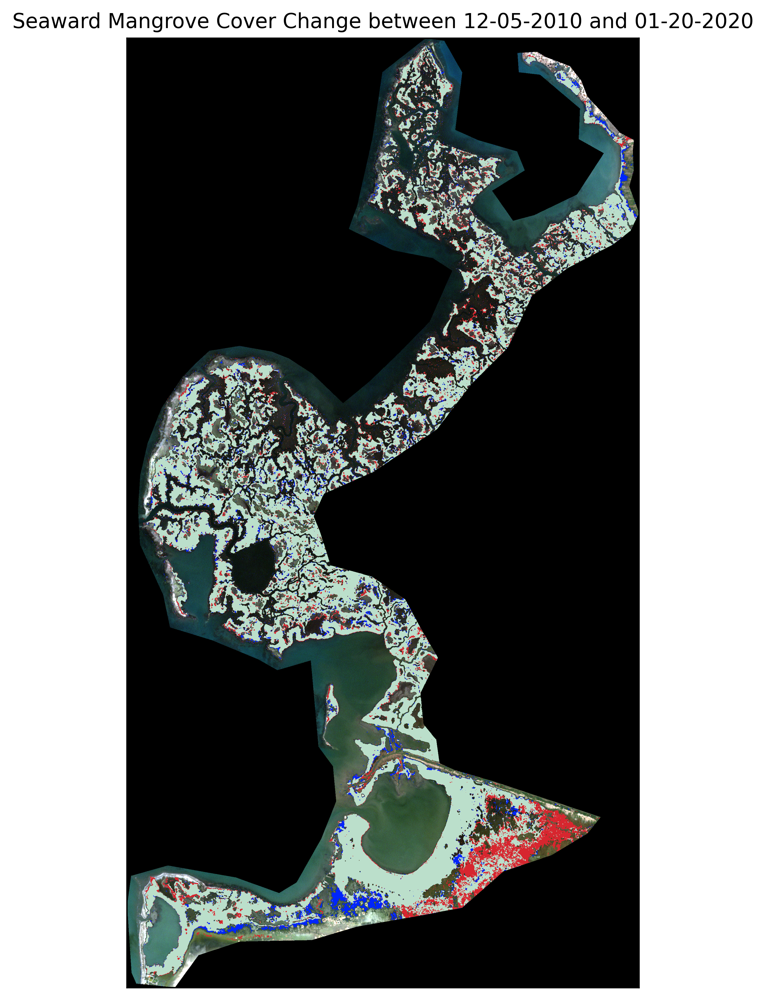

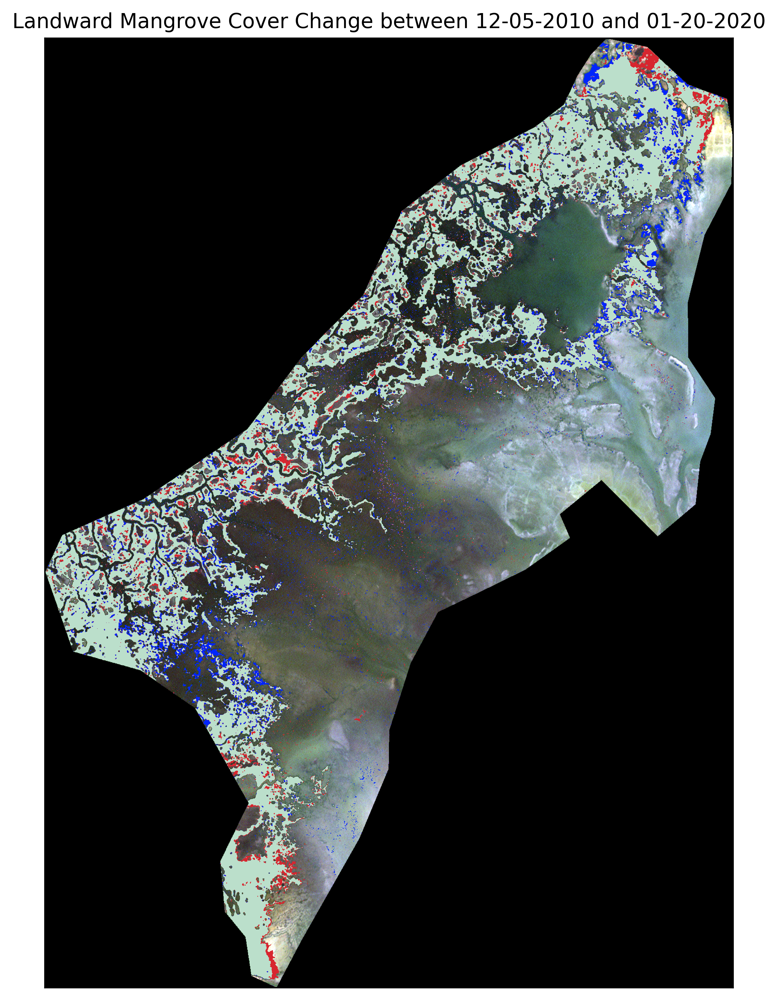

In [ ]:
fig1, ax1 = plt.subplots(figsize=(10,10), dpi=500)
fig2, ax2 = plt.subplots(figsize=(10,10), dpi=500)

custom_cmap = colors_mat.ListedColormap(['#0025FC', '#D7262F', '#BBDFCB'])
boundaries = [0, 2, 4, 6]
custom_norm = colors_mat.BoundaryNorm(boundaries, custom_cmap.N, clip=True)

patches = [mpatches.Patch(color='#D7262F', label='Coastal and Mangrove Retreat'),
            mpatches.Patch(color='#BBDFCB', label='No Change in Cover'),
            mpatches.Patch(color='#0025FC', label='Gained Mangrove Cover')]

seaward = mangroveSites_blur[0]
landward = mangroveSites_blur[1]

ep.plot_rgb(sites[0][times[-1]], rgb=[2,1,0], stretch=True,
            str_clip=.09, ax=ax1)
ep.plot_rgb(sites[1][times[-1]], rgb=[2,1,0], stretch=True,
            str_clip=.09, ax=ax2)

first_sea = np.where(seaward[0] == 1, 4, 0)
first_land = np.where(landward[0] == 1, 4, 0)
last_sea = np.where(seaward[-1] == 1, 2, 0)
last_land = np.where(landward[-1] == 1, 2, 0)
change_sea = first_sea + last_sea
change_land = first_land + last_land
change_mask_sea = np.ma.masked_where(change_sea == 0, change_sea)
change_mask_land = np.ma.masked_where(change_land == 0, change_land)
ax1.imshow(change_mask_sea, cmap=custom_cmap)
ax1.set_title('Seaward Mangrove Cover Change between '+times[0]+' and '+times[-1]);
ax2.imshow(change_mask_land, cmap=custom_cmap)
ax2.set_title('Landward Mangrove Cover Change between '+times[0]+' and '+times[-1]);

#fig1.legend(handles=patches, fontsize='small')
#fig2.legend(handles=patches, fontsize='small')
#fig1.patch.set_facecolor('xkcd:white')
#fig2.patch.set_facecolor('xkcd:white')


In [ ]:
"""fig, axs = plt.subplots(2,2, figsize=(20,20), dpi=300)
axs = list(itertools.chain.from_iterable(axs))
custom_cmap = colors_mat.ListedColormap(['#0025FC', '#D7262F', '#BBDFCB'])
boundaries = [0, 2, 4, 6]
custom_norm = colors_mat.BoundaryNorm(boundaries, custom_cmap.N, clip=True)
#colors = [cm.get_cmap(value) for value in custom_cmap]

patches = [mpatches.Patch(color='#D7262F', label='Coastal and Mangrove Retreat'),
            mpatches.Patch(color='#BBDFCB', label='No Change in Cover'),
            mpatches.Patch(color='#0025FC', label='Gained Mangrove Cover')]

for i,site in enumerate(mangroveSites_blur):
    ep.plot_rgb(sites[i][times[-1]], rgb=[2,1,0], stretch=True,
            str_clip=.09, ax=axs[i])
    # Apply the blurred Image mask to NDVI !!!!!
    first = site[0]
    last = site[-1]
    first = np.where(site[0] == 1, 4, 0)
    last = np.where(site[-1] == 1, 2, 0)
    change = first + last
    change_mask = np.ma.masked_where(change == 0, change)
    axs[i].imshow(change_mask, cmap=custom_cmap)
    axs[i].set_title(aoi_list[i])
    
fig.legend(handles=patches, fontsize='small')
fig.suptitle('Mangrove Cover Change between '+times[0]+' and '+times[-1])
fig.patch.set_facecolor('xkcd:white')
fig.delaxes(axs[-1])
#fig.delaxes(axs[-2])
plt.tight_layout(h_pad=5, w_pad=-15)
plt.show()"""

## UVVR Calculations

The unvegetated-vegetated marsh ratio (UVVR) is a spatially integrative metric that correlates with sediment budgets and sea-level rise *(Ganju et al. 2017)*; it is defined as:

$$ UVVR = \frac{A_{uv}}{A_v}$$ 

where Auv is the unvegetated area within a specified domain, and Av is the vegetated area. The total area of the wetland domain, Ad, is the sum of Auv and Av and the vegetated fraction, Fv, is therefore: <br>

$$ F_v = \frac{A_v}{A_d} $$ 

<br>
Unvegetated areas can represent bare sediment, pools, channels, and intertidal flats. Vegetated areas are typically wetland plain areas, and in a “binary” context, any vegetated plain, regardless of stem density, would be considered vegetated at some nominal spatial scale.

In [ ]:
vegSites = mangroveSites
unvegSites = []

# Using same masking procedure to get unvegetated areas
for site in classifiedSites_r:
    # Masking everything else and keeping mangrove cover and mudflats
    masks = [np.ma.masked_where((pred != 0) & (pred != 3) & (pred != 4) & (pred != 5), pred) for pred in site]
    unvegSites.append(masks)

In [ ]:
# areaSites, changeSites, percChangeSites, secMOAs_x, changeMOA_x, percMOA_x, secMOAs_y, changeMOA_y, percMOA_y, secMOA_pol, changeMOA_pol, percMOA_pol 

unvegArea = get_metrics(unvegSites)[0]
vegArea = get_metrics(vegSites)[0]
uvvrSites = []
for i,site in enumerate(unvegArea):
    uvvr = [np.array(site) / np.array(vegArea[i])]
    uvvrSites.append(uvvr)

In [ ]:
df_uvvr = pd.DataFrame({'AOI': aoi_list})
for i,time in enumerate(times):
    df_uvvr[time] = (np.array(uvvrSites).transpose()[i][0])
df_uvvr

,AOI,12-05-2010,12-28-2011,04-03-2012,01-05-2013,12-22-2014,12-14-2015,09-23-2016,12-27-2017,12-30-2018,12-27-2019,01-20-2020
0,seaward,5.680788,5.227801,6.846072,7.343366,6.328433,7.426095,6.634336,5.941984,5.788917,7.325091,5.885548
1,landward,6.407427,5.027252,6.588067,7.106273,7.035775,6.860891,6.791056,5.724043,5.614061,7.031351,5.477151


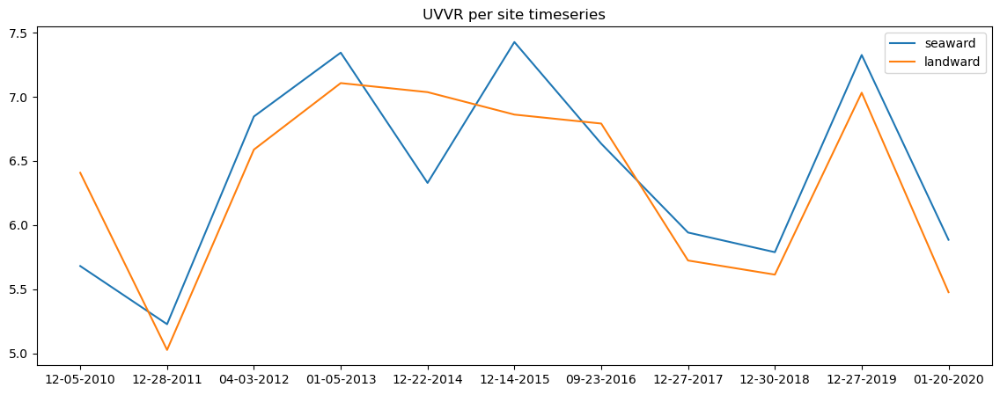

In [ ]:
fig, ax = plt.subplots(figsize=(14,5))
for i, aoi in enumerate(aoi_list):
    ax.plot(df_uvvr.iloc[i][1:], label=aoi)
ax.set_title('UVVR per site timeseries')
ax.legend()

plt.show()

## Mangrove Health Indices Timeseries

### Average NDVI timeseries

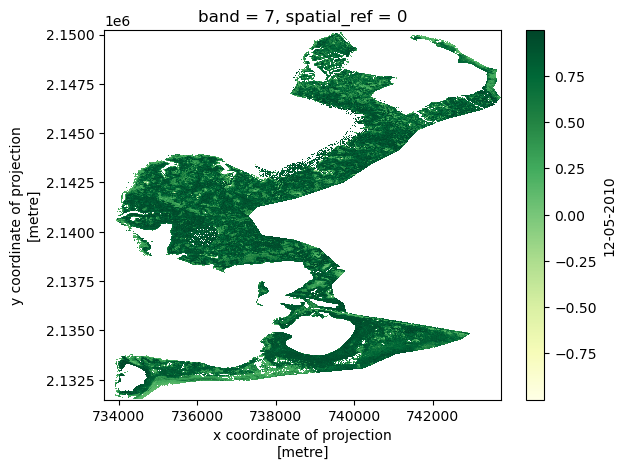

In [ ]:
sites[0][times[0]][-1].plot(cmap='YlGn')

In [ ]:
avg_NDVI = []
for site in sites:
    avg = [site[time][-1].mean().values for time in times]
    avg_NDVI.append(avg)

In [ ]:
df_ndvi = pd.DataFrame({'AOI': aoi_list})
for i,time in enumerate(times):
    df_ndvi[time] = (np.array(avg_NDVI).transpose()[i])
df_ndvi

,AOI,12-05-2010,12-28-2011,04-03-2012,01-05-2013,12-22-2014,12-14-2015,09-23-2016,12-27-2017,12-30-2018,12-27-2019,01-20-2020
0,seaward,0.714113,0.602895,0.395699,0.554796,0.605586,0.62248,0.588365,0.636577,0.647234,0.563616,0.605523
1,landward,0.551409,0.638740,0.382944,0.548293,0.573946,0.58867,0.596658,0.619934,0.633190,0.499733,0.583498


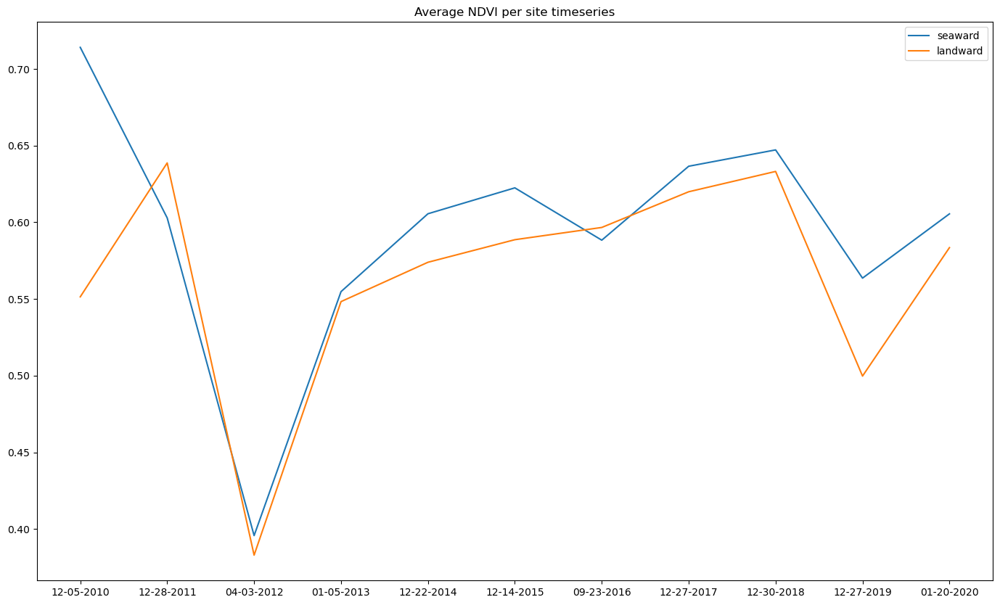

In [ ]:
fig, ax = plt.subplots(figsize=(17,10))
for i, aoi in enumerate(aoi_list):
    ax.plot(df_ndvi.iloc[i][1:], label=aoi)
ax.set_title('Average NDVI per site timeseries')
ax.legend()

plt.show()

### Average MSAVI2 timeseries

In [ ]:
"""sites[0][times[0]][-1].plot(vmin=-1, vmax=1, cmap='PRGn')"""

"sites[0][times[0]][-1].plot(vmin=-1, vmax=1, cmap='PRGn')"

In [ ]:
"""avg_MSAVI2 = []
for site in sites:
    avg = [site[time][-1].mean().values for time in times]
    avg_MSAVI2.append(avg)"""

'avg_MSAVI2 = []\nfor site in sites:\n    avg = [site[time][-1].mean().values for time in times]\n    avg_MSAVI2.append(avg)'

In [ ]:
"""df_msavi = pd.DataFrame({'AOI': aoi_list})
for i,time in enumerate(times):
    df_msavi[time] = (np.array(avg_MSAVI2).transpose()[i])
df_msavi"""

"df_msavi = pd.DataFrame({'AOI': aoi_list})\nfor i,time in enumerate(times):\n    df_msavi[time] = (np.array(avg_MSAVI2).transpose()[i])\ndf_msavi"

## dNVDI Mangrove Health Analysis

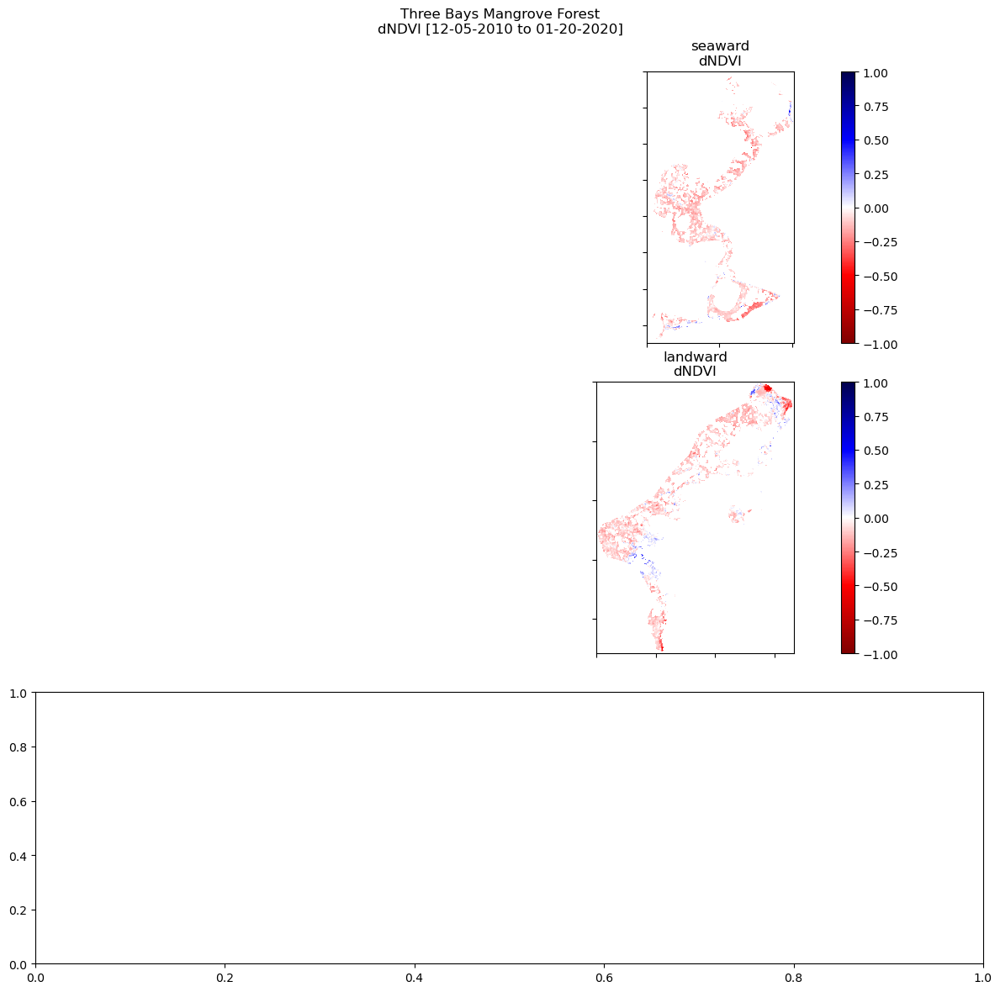

In [ ]:
dndvi = [site[times[-1]][-1] - site[times[0]][-1] for site in sites]

fig, axs = plt.subplots(3,1, figsize=(12,12))

fig.suptitle('Three Bays Mangrove Forest\ndNDVI ['+times[0]+' to '+times[-1]+']')
#axs = list(itertools.chain.from_iterable(axs))
cmaps = ['Set1', 'Pastel2']
divnorm = colors_mat.TwoSlopeNorm(vmin=-1, vmax=1, vcenter=0)

for i,diff in enumerate(dndvi):
    #colors = ["darkorange", "black", "lawngreen"]
    #cmap1 = LinearSegmentedColormap.from_list('viridis', colors)
    nd = axs[i].imshow(diff, cmap='seismic_r', norm=divnorm)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(aoi_list[i]+'\ndNDVI')
    plt.colorbar(nd, ax=axs[i])
plt.tight_layout(h_pad=0, w_pad=-35)
#fig.delaxes(axs[-1])
plt.show()